<a href="https://colab.research.google.com/github/snbmm/Hourly-Energy-Consumption/blob/main/AI_ethics_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Prediction for energy requirement**

In [ ]:
%reset

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import math
import numpy as np
from datetime import datetime

from scipy.stats.mstats import winsorize
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX

from statsmodels.tsa.stl.mstl import MSTL
from statsmodels.tsa.seasonal import DecomposeResult

from fbprophet import Prophet
from sklearn.preprocessing import OneHotEncoder
from pmdarima import auto_arima, arima

**Data cleaning:**

*Loading data*

*Handling duplication*
    
*Handling missing data*

Missing 0 data points before impute
Missing 0 data points after impute


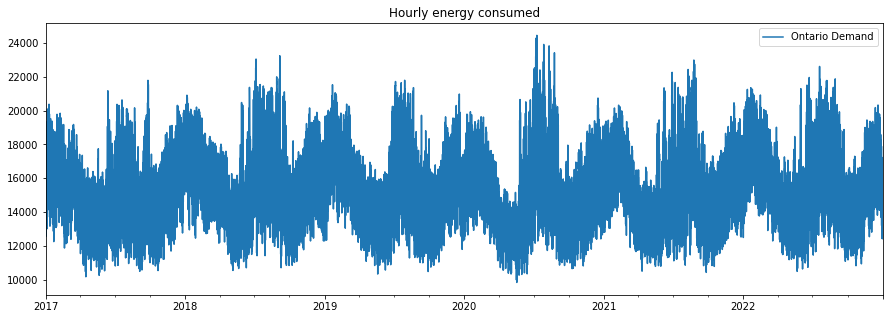

                     Ontario Demand
2017-01-01 00:00:00           13522
2017-01-01 01:00:00           13117
2017-01-01 02:00:00           12816
                     Ontario Demand
2022-12-31 21:00:00           15086
2022-12-31 22:00:00           14453
2022-12-31 23:00:00           13965


In [ ]:
df = pd.read_csv('./PUB_Demand.csv')
df['Datetime_string'] = df['Date'] + " " + (df['Hour']-1).astype(str)+ ":00:00"
df['Datetime'] = pd.to_datetime(df['Datetime_string'])
df = df[["Datetime","Ontario Demand"]]

# Check duplication and drop the later records
df.drop_duplicates(subset='Datetime', keep='first', inplace=True)

# Check missing data point and impute with linear interpolation
df.index = pd.to_datetime(df['Datetime'])
df.drop(columns=df.columns[0],inplace = True)
date_range = pd.date_range(df.index.min(), df.index.max(), freq="1H")
print("Missing {} data points before impute".format(len(date_range.difference(df.index))))
df = df.reindex(date_range)
df['Ontario Demand'].interpolate(inplace=True)
print("Missing {} data points after impute".format(len(date_range.difference(df.index))))

df.plot(
    figsize=(15, 5),
    title='Hourly energy consumed')
plt.show()

print(df.head(3))
print(df.tail(3))

In [ ]:
# Feature engineering
def get_season(date):
    spring = range(80, 172)
    summer = range(172, 264)
    fall = range(264, 355)
    seasons = []
    for d in date:
        if d in spring:
            seasons.append('spring')
        elif d in summer:
            seasons.append('summer')
        elif d in fall:
            seasons.append('fall')
        else:
            seasons.append('winter')
    return seasons

def get_activity(hours):
    active = range(11, 21)
    sleep = range(0, 7)
    hour_bins = []
    for i in hours:
        if i in active:
            hour_bins.append('active')
        elif i in sleep:
            hour_bins.append('sleep')
        else:
            hour_bins.append('normal')
    return hour_bins

def get_features(df_input):

    df = pd.DataFrame()
    df.index = df_input.index
    df['ds'] = df_input.index
    #df['year'] = df_input.index.year
    df['season'] = get_season(df_input.index.dayofyear)
    df['month'] = df_input.index.month.astype("category")
    print(df['month'][1])
    df['week'] = df_input.index.weekofyear.astype("category")

    #df['DOY'] = df.index.dt.dayofyear
    df['DOM'] = df_input.index.day.astype("category")
    df['DOW'] = df_input.index.dayofweek
    df['HOD'] = df_input.index.hour

    df['weekday'] = (df['DOW']<5).astype(str)
    df["season_HOD"] = df['season'] + get_activity(df['HOD'])
    df["season_DOW"] = df['season'] + df['weekday']
    df["HOD_DOW"] = get_activity(df['HOD']) + df['weekday']
    df["season_HOD_DOW"] = df['season'] + get_activity(df['HOD']) + df['weekday']
    df['y'] = df_input['Ontario Demand']
    
    df.drop(columns=['weekday'], inplace = True)
    df['DOW'] = df['DOW'].astype("category")
    df['HOD'] = df['HOD'].astype("category")
    df[df.select_dtypes(['object']).columns] = df.select_dtypes(['object']).apply(lambda x: x.astype('category'))

    return df

def mape(test, f): 
    test, f = np.array(test), np.array(f)
    return np.mean(np.abs((test - f) / test)) * 100

1
[0]	validation_0-mape:0.69688
[1]	validation_0-mape:0.48356


/var/folders/z0/s0q2v3kn0b145_kjfj_sd4pr0000gn/T/ipykernel_70708/2326917331.py:40: FutureWarning: weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series. To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)
  df['week'] = df_input.index.weekofyear.astype("category")
/Users/minxiangliu/miniforge3/lib/python3.9/site-packages/xgboost/sklearn.py:793: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/Users/minxiangliu/miniforge3/lib/python3.9/site-packages/xgboost/sklearn.py:793: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-mape:0.33532
[3]	validation_0-mape:0.23063
[4]	validation_0-mape:0.15801
[5]	validation_0-mape:0.10809
[6]	validation_0-mape:0.07637
[7]	validation_0-mape:0.05744
[8]	validation_0-mape:0.04775
[9]	validation_0-mape:0.04330
[10]	validation_0-mape:0.04158
[11]	validation_0-mape:0.04106
[12]	validation_0-mape:0.04101
[13]	validation_0-mape:0.04134
[14]	validation_0-mape:0.04180
[15]	validation_0-mape:0.04199
[16]	validation_0-mape:0.04218
[17]	validation_0-mape:0.04243
[18]	validation_0-mape:0.04252
[19]	validation_0-mape:0.04267
[20]	validation_0-mape:0.04283
[21]	validation_0-mape:0.04311
[22]	validation_0-mape:0.04329
[23]	validation_0-mape:0.04332
[24]	validation_0-mape:0.04335
[25]	validation_0-mape:0.04340
[26]	validation_0-mape:0.04335
[27]	validation_0-mape:0.04350
[28]	validation_0-mape:0.04356
[29]	validation_0-mape:0.04356
[30]	validation_0-mape:0.04356
[31]	validation_0-mape:0.04358
[32]	validation_0-mape:0.04376
[33]	validation_0-mape:0.04374
[34]	validation_

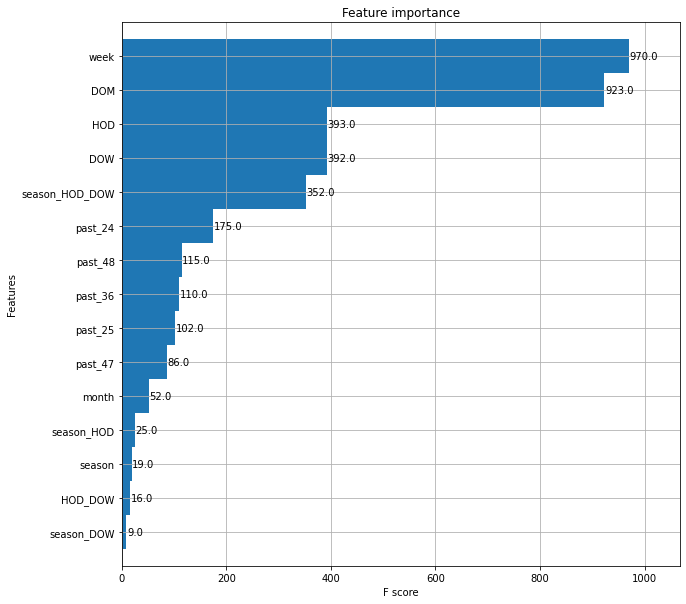

In [ ]:
df_featured = get_features(df)
exogenous_features = []
for i in [24, 48, 36, 25, 47]:#list(range(24,49)):
    df_featured['past_{}'.format(i)] = df_featured['y'].shift(i)
    exogenous_features.append('past_{}'.format(i))

exogenous_features += ['season', 'DOM', 'season_HOD', 'season_DOW', 'HOD_DOW', 'season_HOD_DOW']

# Test/Val/Train split
df_train_featured = df_featured.loc[df.index < '2020-07-01']
df_val_featured = df_featured.loc[(df.index < '2021-01-01') & (df.index >= '2020-07-01')]
df_test_featured = df_featured.loc[df.index >= '2021-01-01']

#XGBoost
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_absolute_percentage_error
df_val_featured = df_train_featured[-6000:]
df_train_featured = df_train_featured[:-6001]
model = xgb.XGBRegressor(
        n_estimators=1000,
        enable_categorical=True,
        tree_method="hist")
model.fit(df_train_featured.drop(columns=['ds','y']), df_train_featured['y'],
        eval_set=[
                (df_val_featured.drop(columns=['ds','y']), df_val_featured['y'])],
        early_stopping_rounds=50,
        eval_metric='mape')
ax = plot_importance(model, height=1)
fig = ax.figure
fig.set_size_inches(10, 10)

The hourly MAPE on the feaured test set is : 
 4.382764587030097%


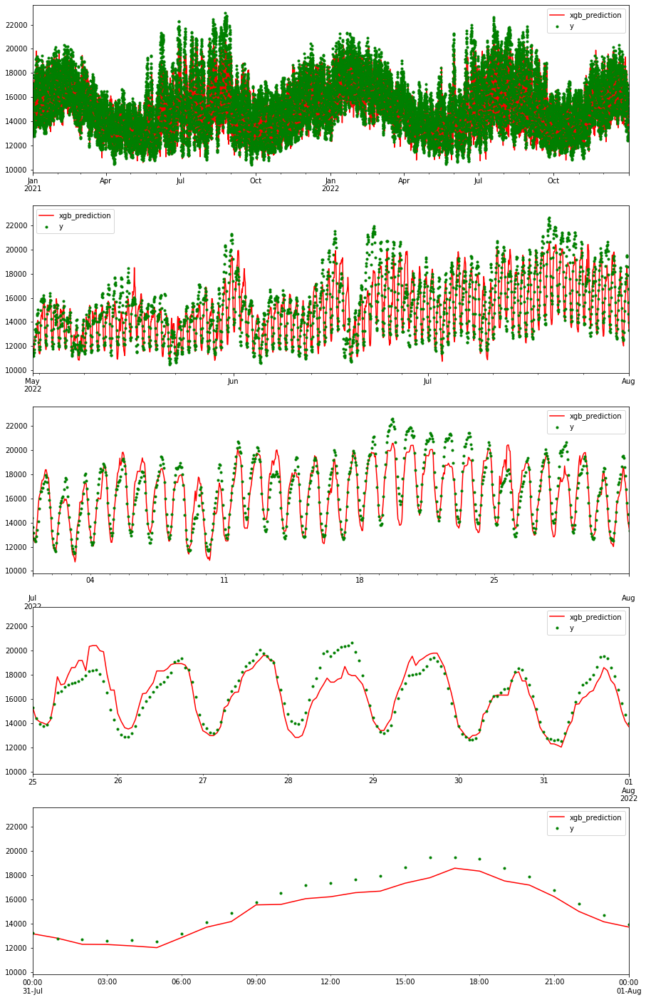

In [ ]:
prediction_xgboost = pd.DataFrame(model.predict(df_test_featured.drop(columns=['ds','y'])))
prediction_xgboost.index = df_test_featured.index
prediction_xgboost.rename(columns={0:'xgb_prediction'},inplace = True)
compare = pd.DataFrame(prediction_xgboost.join(df_test_featured,how='inner'))
# Result Display
f, (ax_whole, ax_three_months, ax_month, ax_week, ax_day) = plt.subplots(5,1)
f.set_figheight(25)
f.set_figwidth(15)
compare['xgb_prediction'].plot(ax=ax_whole, color='r',legend=True)
compare['y'].plot(style='.',ax=ax_whole, color='g',legend=True)
ax_whole.set_xlim(xmin = pd.to_datetime('2021-01-01'))

compare['xgb_prediction'].plot(ax=ax_three_months, color='r',legend=True)
compare['y'].plot(style='.',ax=ax_three_months, color='g',legend=True)
ax_three_months.set_xlim(pd.to_datetime(['2022-05-01', '2022-08-01']))

compare['xgb_prediction'].plot(ax=ax_month, color='r',legend=True)
compare['y'].plot(style='.',ax=ax_month, color='g',legend=True)
ax_month.set_xlim(pd.to_datetime(['2022-07-01', '2022-08-01']))

compare['xgb_prediction'].plot(ax=ax_week, color='r',legend=True)
compare['y'].plot(style='.',ax=ax_week, color='g',legend=True)
ax_week.set_xlim(pd.to_datetime(['2022-07-25', '2022-08-01']))

compare['xgb_prediction'].plot(ax=ax_day, color='r',legend=True)
compare['y'].plot(style='.',ax=ax_day, color='g',legend=True)
ax_day.set_xlim(pd.to_datetime(['2022-07-31', '2022-08-01']))

mae = mape(df_test_featured['y'],prediction_xgboost['xgb_prediction'])

print("The hourly MAPE on the feaured test set is : \n {}%".format(mae))

In [ ]:
# Prophet model

# OneHotEncode for categorical data
encoded_df_train_featured = df_train_featured.copy()
encoded_df_test_featured = df_test_featured.copy()
encoded_df_train_featured.reset_index(drop=True, inplace=True)
encoded_df_test_featured.reset_index(drop=True, inplace=True)

exogenous_features = ['season', 'month', 'week', 'DOM', 'DOW', 'HOD', 'season_HOD',
       'season_DOW', 'HOD_DOW', 'season_HOD_DOW']
#exogenous_features = ['season', 'DOM', 'season_HOD', 'season_DOW', 'HOD_DOW', 'season_HOD_DOW']
oe_style = OneHotEncoder()
oe_results = oe_style.fit_transform(df_train_featured[exogenous_features]).toarray()
feature_names = oe_style.get_feature_names_out(exogenous_features)
encoded_df_train_featured = pd.concat([encoded_df_train_featured, 
               pd.DataFrame(oe_results,columns=feature_names).astype(int)], axis=1)

df_test_featured['week'][df_test_featured['week'] == 53] = 52
oe_test_results = oe_style.transform(df_test_featured[exogenous_features]).toarray()
encoded_df_test_featured = pd.concat([encoded_df_test_featured, 
               pd.DataFrame(oe_test_results,columns=feature_names).astype(int)], axis=1)

/var/folders/z0/s0q2v3kn0b145_kjfj_sd4pr0000gn/T/ipykernel_70708/3905053610.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_test_featured['week'][df_test_featured['week'] == 53] = 52


/Users/minxiangliu/miniforge3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)


Initial log joint probability = -198.387
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99         71143    0.00121905       6965.34           1           1      126   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     199       71268.5   0.000878589       3080.49           1           1      237   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       71317.3    0.00185479       2057.72      0.9057      0.9057      344   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     399       71340.4   0.000797448        1148.2           1           1      453   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     499       71348.8   0.000278212       1322.69           1           1      562   
    Iter      log prob        ||dx||      ||grad||       alpha  

/Users/minxiangliu/miniforge3/lib/python3.9/site-packages/fbprophet/forecaster.py:1201: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df['trend'] = self.predict_trend(df)
/Users/minxiangliu/miniforge3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/minxiangliu/miniforge3/lib/python3.9/site-packages/fbprophet/forecaster.py:891: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  components = components.append(new_comp)
/Users/minxiangliu/miniforge3/lib/python3.9/site-packages/fbprophet/fo

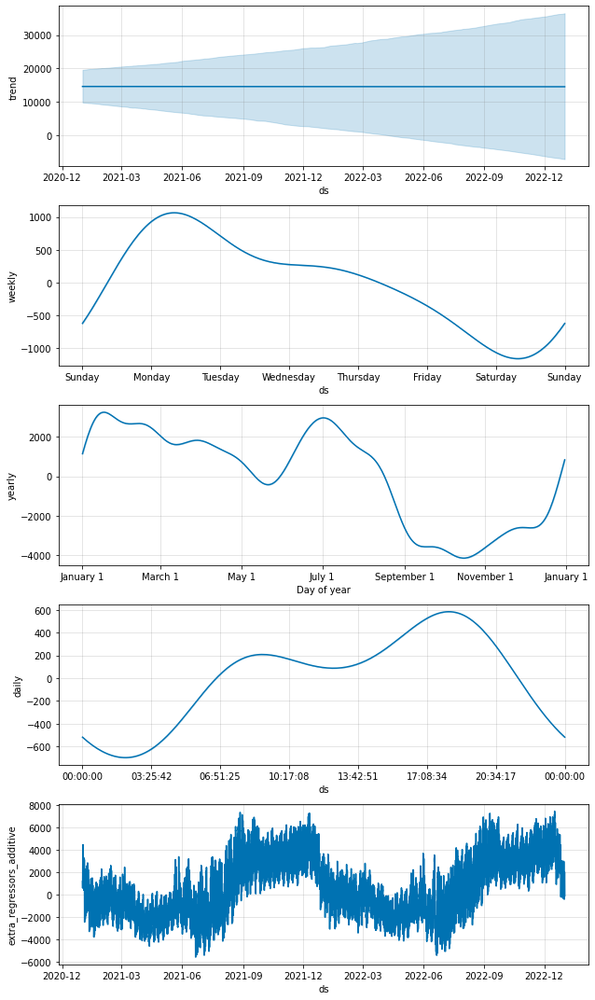

In [ ]:
model_features = Prophet()
for feature in list(feature_names) + ['past_24', 'past_25',
       #'past_26', 'past_27', 'past_28', 'past_29', 'past_30', 'past_31',
       #'past_32', 'past_33', 'past_34', 'past_35', 'past_36', 'past_37',
       #'past_38', 'past_39', 'past_40', 'past_41', 'past_42', 'past_43',
       #'past_44', 'past_45', 'past_46', 
       'past_47', 'past_48']:
	model_features.add_regressor(feature)
model_features.fit(encoded_df_train_featured[48:])

predict_prophet = model_features.predict(df=encoded_df_test_featured)
fig = model_features.plot_components(predict_prophet)

The hourly MAE on the feaured test set is : 
 4.683961699999506%


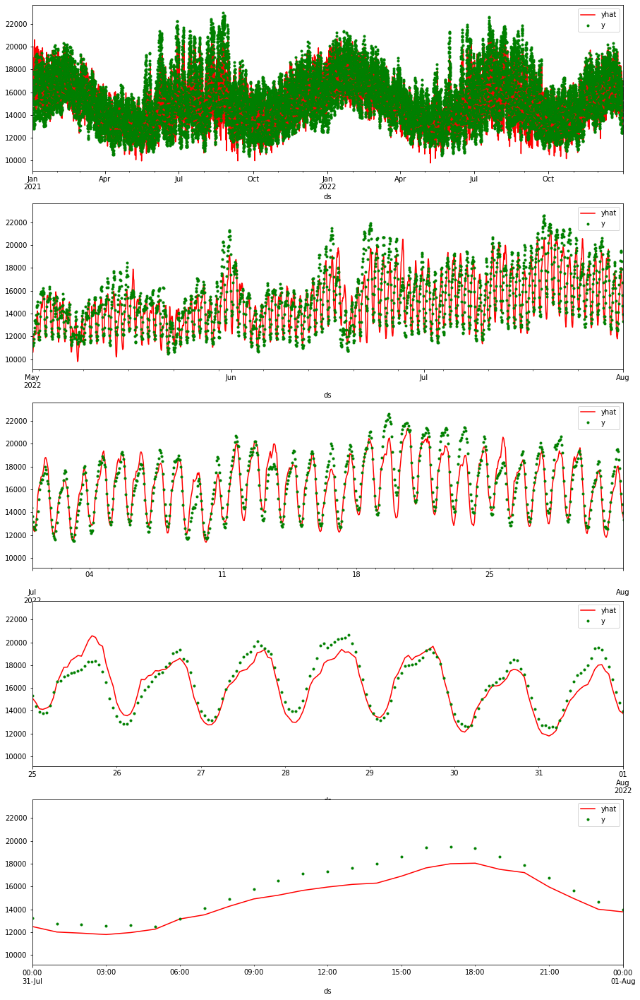

In [ ]:
# Result Display
compare = pd.concat(
    [predict_prophet.set_index('ds')['yhat'], 
    df_test_featured.set_index('ds')['y']],
    axis=1)
# Result Display
f, (ax_whole, ax_three_months, ax_month, ax_week, ax_day) = plt.subplots(5,1)
f.set_figheight(25)
f.set_figwidth(15)
compare['yhat'].plot(ax=ax_whole, color='r',legend=True)
compare['y'].plot(style='.',ax=ax_whole, color='g',legend=True)
ax_whole.set_xlim(xmin = pd.to_datetime('2021-01-01'))

compare['yhat'].plot(ax=ax_three_months, color='r',legend=True)
compare['y'].plot(style='.',ax=ax_three_months, color='g',legend=True)
ax_three_months.set_xlim(pd.to_datetime(['2022-05-01', '2022-08-01']))

compare['yhat'].plot(ax=ax_month, color='r',legend=True)
compare['y'].plot(style='.',ax=ax_month, color='g',legend=True)
ax_month.set_xlim(pd.to_datetime(['2022-07-01', '2022-08-01']))

compare['yhat'].plot(ax=ax_week, color='r',legend=True)
compare['y'].plot(style='.',ax=ax_week, color='g',legend=True)
ax_week.set_xlim(pd.to_datetime(['2022-07-25', '2022-08-01']))

compare['yhat'].plot(ax=ax_day, color='r',legend=True)
compare['y'].plot(style='.',ax=ax_day, color='g',legend=True)
ax_day.set_xlim(pd.to_datetime(['2022-07-31', '2022-08-01']))

mae = mape(compare['y'],compare['yhat'])

print("The hourly MAE on the feaured test set is : \n {}%".format(mae))

In [ ]:
df_featured_x_lstm = pd.concat([
    encoded_df_train_featured,
    encoded_df_test_featured]
    )[['y']].astype(float)
# df_featured_x_lstm['DOW'] = df_featured_x_lstm['DOW']/7
# df_featured_x_lstm['DOM'] = df_featured_x_lstm['DOW']/31
df_featured_y_lstm = pd.concat([
    encoded_df_train_featured,
    encoded_df_test_featured]
    )['y']
#df_featured_x_lstm = df_arima['y']
#df_featured_y_lstm = df_arima['y']

#max_y = df_train_arima['y'].max()*1.2
#min_y = df_train_arima['y'].min()/1.2
max_y = df_featured_x_lstm['y'].max()*1.2
min_y = df_featured_x_lstm['y'].min()/1.2
df_featured_x_lstm = (df_featured_x_lstm - min_y)/(max_y-min_y)
df_featured_y_lstm = (df_featured_y_lstm - min_y)/(max_y-min_y)
x_train = []
y_train = []
seq = 24*7
seq_end = 48
for i in range(seq, len(df_featured_y_lstm)):#len(df_featured_y)):
    x_train.append(df_featured_x_lstm.iloc[i-seq : i-seq_end:24].append(df_featured_x_lstm.iloc[i-seq_end : i-23:4]))
    #x_train.append(df_featured_x_lstm.iloc[i-seq_end : i-25:4, ])
    y_train.append(df_featured_y_lstm.iloc[i])

/var/folders/z0/s0q2v3kn0b145_kjfj_sd4pr0000gn/T/ipykernel_70708/30424312.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_train.append(df_featured_x_lstm.iloc[i-seq : i-seq_end:24].append(df_featured_x_lstm.iloc[i-seq_end : i-23:4]))
/var/folders/z0/s0q2v3kn0b145_kjfj_sd4pr0000gn/T/ipykernel_70708/30424312.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_train.append(df_featured_x_lstm.iloc[i-seq : i-seq_end:24].append(df_featured_x_lstm.iloc[i-seq_end : i-23:4]))
/var/folders/z0/s0q2v3kn0b145_kjfj_sd4pr0000gn/T/ipykernel_70708/30424312.py:25: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  x_train.append(df_featured_x_lstm.iloc[i-seq : i-seq_end:24].append(df_featured_x_lstm.iloc[i-seq_end : i-23:4]))
/var/folde

In [ ]:
split_at = len(encoded_df_test_featured)
x_test = np.array(x_train[-split_at:]).astype('float32')             
y_test = np.array(y_train[-split_at:]).astype('float32')
x_train = np.array(x_train[:-split_at]).astype('float32')             
y_train = np.array(y_train[:-split_at]).astype('float32')

x_train = np.reshape(x_train, (x_train.shape[0], 12, 1))
x_test = np.reshape(x_test, (x_test.shape[0], 12, 1))

Metal device set to: Apple M1 Pro

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB



2023-01-19 01:49:11.846796: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2023-01-19 01:49:11.847081: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 12, 50)            10400     
                                                                 
 lstm_1 (LSTM)               (None, 12, 50)            20200     
                                                                 
 lstm_2 (LSTM)               (None, 50)                20200     
                                                                 
 dense (Dense)               (None, 1)                 51        
                                                                 
Total params: 50,851
Trainable params: 50,851
Non-trainable params: 0
_________________________________________________________________
Epoch 1/100


2023-01-19 01:49:12.360753: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-01-19 01:49:14.353878: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-01-19 01:49:14.849645: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-01-19 01:49:15.015630: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-01-19 01:49:15.083126: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-01-19 01:49:15.199281: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-01-19 01:49:15.398035: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113

123/123 [==============================] - 7s 35ms/step - loss: 0.0088
Epoch 2/100
123/123 [==============================] - 4s 33ms/step - loss: 0.0057
Epoch 3/100
123/123 [==============================] - 4s 31ms/step - loss: 0.0053
Epoch 4/100
123/123 [==============================] - 4s 32ms/step - loss: 0.0050
Epoch 5/100
123/123 [==============================] - 4s 31ms/step - loss: 0.0048
Epoch 6/100
123/123 [==============================] - 4s 32ms/step - loss: 0.0045
Epoch 7/100
123/123 [==============================] - 4s 31ms/step - loss: 0.0042
Epoch 8/100
123/123 [==============================] - 4s 30ms/step - loss: 0.0036
Epoch 9/100
123/123 [==============================] - 4s 30ms/step - loss: 0.0031
Epoch 10/100
123/123 [==============================] - 4s 31ms/step - loss: 0.0029
Epoch 11/100
123/123 [==============================] - 4s 30ms/step - loss: 0.0028
Epoch 12/100
123/123 [==============================] - 4s 31ms/step - loss: 0.0027
Epoch 13/100


2023-01-19 01:55:36.838497: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-01-19 01:55:37.022757: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-01-19 01:55:37.099570: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2023-01-19 01:55:37.175238: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


LSTM model mape on hourly train data is  4.165153950452805


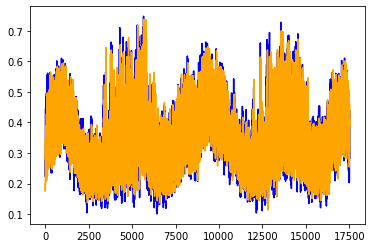

In [ ]:
#LSTM

from keras.layers import Dense,Dropout,SimpleRNN,LSTM,CuDNNLSTM
from keras.models import Sequential
lstm_model = Sequential()

lstm_model.add(LSTM(50,return_sequences=True, input_shape=(x_train.shape[1],x_train.shape[2])))

lstm_model.add(LSTM(50,return_sequences=True))

lstm_model.add(LSTM(50,return_sequences=False))

lstm_model.add(Dense(1))

lstm_model.summary()

lstm_model.compile(loss="MSE")
lstm_model.fit(x_train, y_train, epochs=100, batch_size=200, validation_batch_size=100)

lstm_train_predictions = lstm_model.predict(x_train)

lstm_train_score = mape(
    y_train.reshape(len(y_train))*(max_y-min_y)+min_y, 
    lstm_train_predictions.reshape(len(lstm_train_predictions))*(max_y-min_y)+min_y
    )
print("LSTM model mape on hourly train data is ",lstm_train_score)

lstm_predictions = lstm_model.predict(x_test)

plt.plot(y_test, color='blue',label='Actual power consumption data')
plt.plot(lstm_predictions, color='orange',label='Predicted power consumption data')

The hourly MAE on the feaured test set is : 
 4.586341536207363%


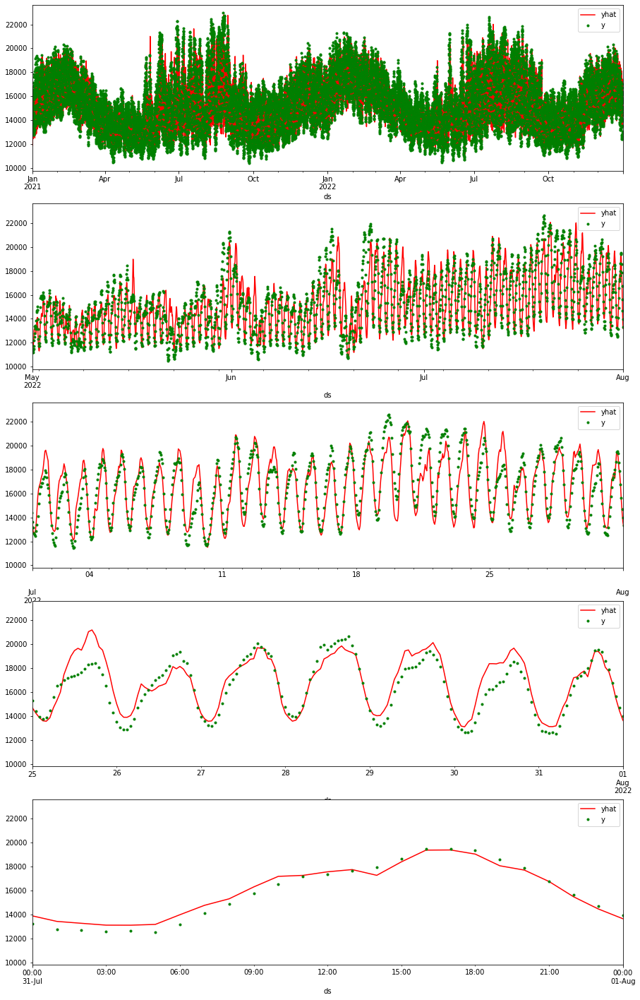

In [ ]:
# Result Display
# Result Display

compare = pd.concat(
    [df_test_featured.set_index('ds')['y']],
    axis=1)
compare['yhat'] = lstm_predictions*(max_y-min_y) + min_y
# Result Display
f, (ax_whole, ax_three_months, ax_month, ax_week, ax_day) = plt.subplots(5,1)
f.set_figheight(25)
f.set_figwidth(15)
compare['yhat'].plot(ax=ax_whole, color='r',legend=True)
compare['y'].plot(style='.',ax=ax_whole, color='g',legend=True)
ax_whole.set_xlim(xmin = pd.to_datetime('2021-01-01'))

compare['yhat'].plot(ax=ax_three_months, color='r',legend=True)
compare['y'].plot(style='.',ax=ax_three_months, color='g',legend=True)
ax_three_months.set_xlim(pd.to_datetime(['2022-05-01', '2022-08-01']))

compare['yhat'].plot(ax=ax_month, color='r',legend=True)
compare['y'].plot(style='.',ax=ax_month, color='g',legend=True)
ax_month.set_xlim(pd.to_datetime(['2022-07-01', '2022-08-01']))

compare['yhat'].plot(ax=ax_week, color='r',legend=True)
compare['y'].plot(style='.',ax=ax_week, color='g',legend=True)
ax_week.set_xlim(pd.to_datetime(['2022-07-25', '2022-08-01']))

compare['yhat'].plot(ax=ax_day, color='r',legend=True)
compare['y'].plot(style='.',ax=ax_day, color='g',legend=True)
ax_day.set_xlim(pd.to_datetime(['2022-07-31', '2022-08-01']))

mae = mape(compare['y'],compare['yhat'])

print("The hourly MAE on the feaured test set is : \n {}%".format(mae))

XGBoost has daily prediction with mape 4.38295477495287%
LSTM has daily prediction with mape 4.586413943966135%
Prophet has daily prediction with mape 4.6840416558545375%
Bagging has daily prediction with mape 4.119616385632367%


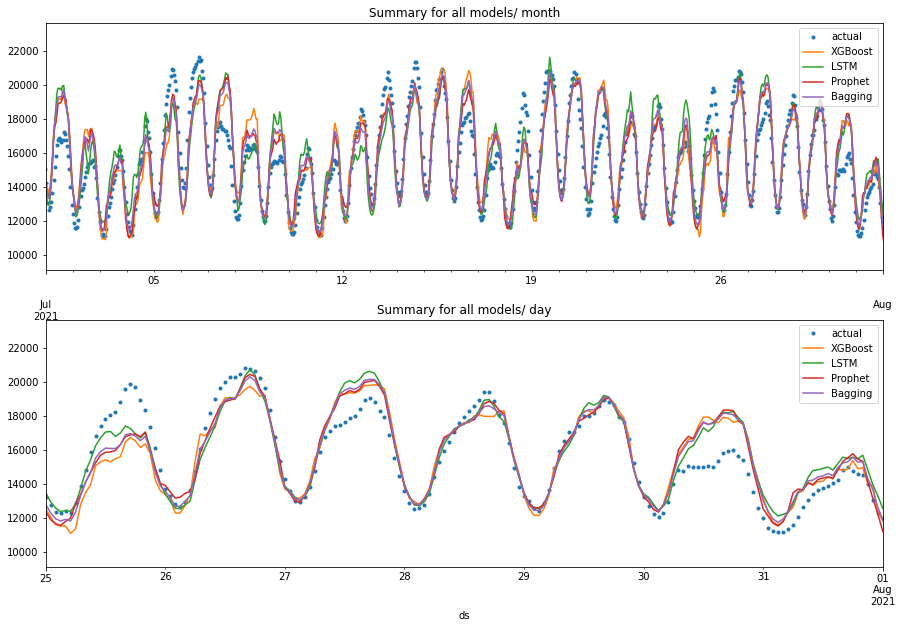

In [ ]:
final_result = pd.DataFrame()
final_result['actual'] = df_test_featured.set_index('ds')['y']
final_result['XGBoost'] = prediction_xgboost['xgb_prediction']
final_result['LSTM'] = lstm_predictions*(max_y-min_y) + min_y
final_result['Prophet'] = predict_prophet.set_index('ds')['yhat']
final_result = final_result[:-1]
final_result['Bagging'] = final_result[['XGBoost','LSTM', 'Prophet']].mean(axis=1)

f, (ax_month, ax_week) = plt.subplots(2,1)
f.set_figheight(10)
f.set_figwidth(15)

final_result.plot(style = ['.','-','-','-','-'], legend=True, title="Summary for all models/ month",ax = ax_month) 
ax_month.set_xlim(pd.to_datetime(['2021-07-01', '2021-08-01']))

final_result.plot(style = ['.','-','-','-','-'], legend=True, title="Summary for all models/ day",ax = ax_week) 
ax_week.set_xlim(pd.to_datetime(['2021-07-25', '2021-08-01']))

for i in final_result.columns.drop('actual'):
    print("{} has daily prediction with mape {}%".format(i,mape(final_result['actual'], final_result[i])))
